In [ ]:
import matplotlib.pyplot as plt
import networkx as nx
import plotly.graph_objects as go

In [ ]:
colors = [
    "#FF5733",  # Red
    "#33FF57",  # Green
    "#3357FF",  # Blue
    "#FF33E6",  # Pink
    "#FFA500",  # Orange
    "#800080",  # Purple
    "#FFD700",  # Gold
    "#1E90FF",  # DodgerBlue
    "#7FFF00",  # Chartreuse
    "#FF69B4",  # HotPink
    "#32CD32",  # LimeGreen
    "#8A2BE2",  # BlueViolet
    "#FFFF00",  # Yellow
    "#FF8C00",  # DarkOrange
    "#2E8B57",  # SeaGreen
    "#DC143C",  # Crimson
    "#FF1493",  # DeepPink
    "#008B8B",  # DarkCyan
    "#9932CC",  # DarkOrchid
    "#228B22",  # ForestGreen
    "#B22222",  # FireBrick
    "#D2691E",  # Chocolate
    "#87CEEB",  # SkyBlue
    "#FF4500",  # OrangeRed
    "#40E0D0",  # Turquoise
    "#BA55D3",  # MediumOrchid
    "#4682B4",  # SteelBlue
    "#00FF7F",  # SpringGreen
    "#4B0082",  # Indigo
    "#9400D3",  # DarkViolet
    "#808080",  # Gray
    "#000000",  # Black
    "#FFFFFF",  # White
    "#FF00FF",  # Magenta
    "#00FFFF",  # Cyan
    "#FFFF00",  # Yellow
    "#A0522D",  # Sienna
    "#8B008B",  # DarkMagenta
    "#006400",  # DarkGreen
    "#00FF00",  # Lime
    "#FF8C00",  # DarkOrange
    "#FF4500"   # OrangeRed
]

In [ ]:
# Download datasets from http://snap.stanford.edu/data/email-Eu-core.html
import requests
import gzip
import os


def download_file(url, name):
    # Send an HTTP GET request to the URL
    response = requests.get(url)

    if response.status_code == 200:
        # Request was successful, save the content to a local .gz file
        with open("downloaded_file.gz", "wb") as file:
            file.write(response.content)

        # Extract the .gz file
        with gzip.open("downloaded_file.gz", "rt") as gz_file:
            # Read the content of the text file
            content = gz_file.read()

        # Save the content to a local .txt file
        with open(name, "w") as txt_file:
            txt_file.write(content)

        # Remove the downloaded .gz file
        os.remove("downloaded_file.gz")

        print(f"File extracted and saved as {name}.")
    else:
        print(f"Failed to download the .gz file. Status code: {response.status_code}")

download_file("https://snap.stanford.edu/data/email-Eu-core.txt.gz", "email-Eu-core.txt")
download_file("http://snap.stanford.edu/data/email-Eu-core-department-labels.txt.gz", "email-Eu-core-department-labels.txt")



File extracted and saved as email-Eu-core.txt.
File extracted and saved as email-Eu-core-department-labels.txt.


In [ ]:
G = nx.Graph()

# Specify the path to your text file containing edges
file_path = "email-Eu-core.txt"

# Read the text file and add edges to the graph
with open(file_path, "r") as file:
    for line in file:
        # Split each line into two nodes
        node1, node2 = line.strip().split()

        # Add the edge to the graph
        G.add_edge(node1, node2)

# Specify the path to your text file containing department information
department_file_path = "email-Eu-core-department-labels.txt"

# Read the department file and add department labels as node attributes
with open(department_file_path, "r") as file:
    for line in file:
        node, department = line.strip().split()

        # Add the department label as a node attribute
        G.nodes[node]['department'] = department
        G.nodes[node]['color'] = colors[int(department)]

In [ ]:
def plot_graph_networkx(G, pos):
    # node_colors = [G.nodes[node]['color'] for node in G.nodes()]
    plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
    ax = plt.gca()
    ax.set_facecolor('white')

    # Draw nodes with desired node color
    # nx.draw_networkx_nodes(G, pos,  node_color=node_colors, node_size=10)
    nx.draw_networkx_nodes(G, pos, node_size=10)

    # Draw edges with a specific edge width and color
    nx.draw_networkx_edges(G, pos, width=0.1, edge_color='grey')

    # Turn off axis labels and display the plot
    ax.set_xticks([])  # Turn off x-axis labels
    ax.set_yticks([])  # Turn off y-axis labels
    plt.show()

def plot_graph_plotly(G, pos):
    node_colors = [G.nodes[node]['color'] for node in G.nodes()]
    node_x = []
    node_y = []

    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    edge_x = []
    edge_y = []

    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.25, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_trace = go.Scatter(
        x=[pos[node][0] for node in G.nodes()],
        y=[pos[node][1] for node in G.nodes()],
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=False,  # Do not use a colorscale
            color=node_colors,  # Use department-based node colors
            size=5,
            colorbar=dict(
                thickness=15,
                title='Node Department',
                xanchor='left',
                titleside='right'
            )
        )
    )

    # Add node labels if you want
    node_text = list(G.nodes())
    node_trace.text = node_text
    layout = go.Layout(
        showlegend=False,
        hovermode='closest',
        margin=dict(b=0, l=0, r=0, t=0),
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        # width=20*40,  # 20 by 20 figure size (20 units per inch)
        height=20*40,
    )

    fig = go.Figure(data=[edge_trace, node_trace], layout=layout)
    fig.show()

In [ ]:
kamada_kawai_layout = nx.kamada_kawai_layout(G)

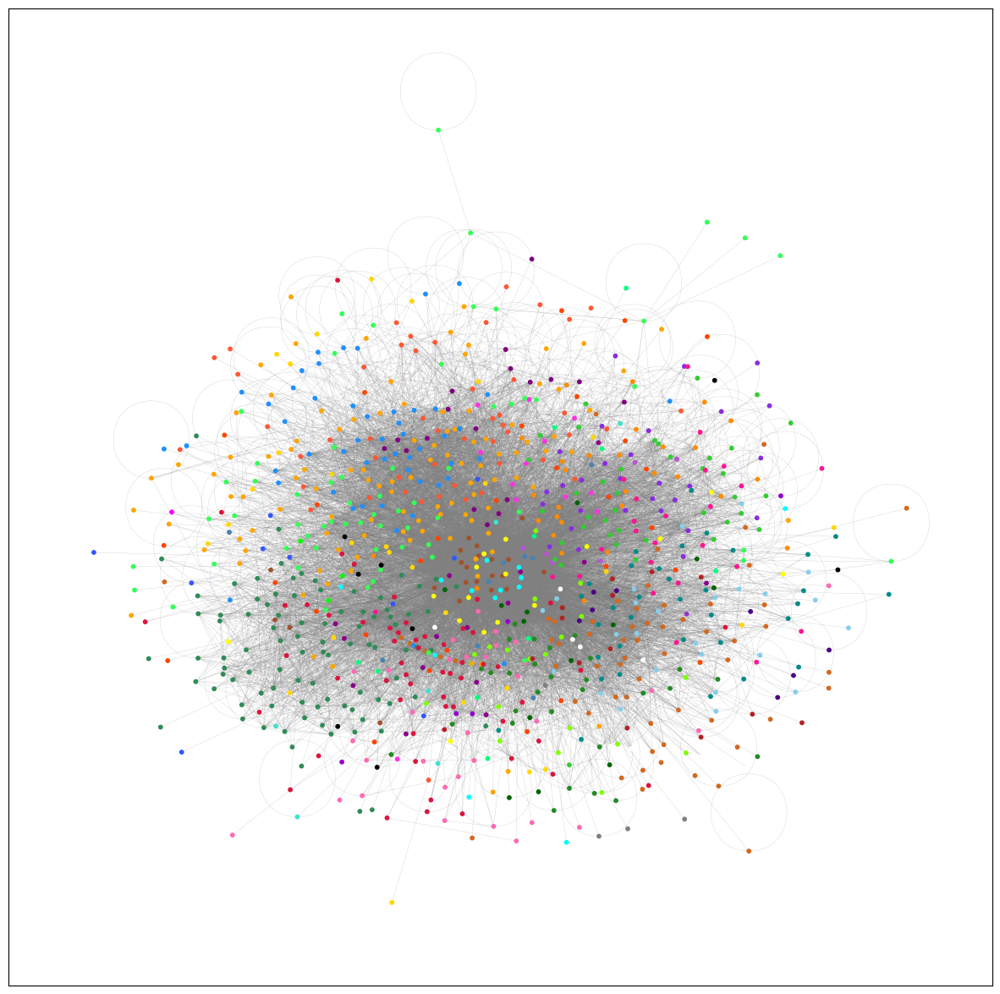

In [ ]:
plot_graph_networkx(G, pos = kamada_kawai_layout)

In [ ]:
plot_graph_plotly(G,kamada_kawai_layout )

In [ ]:
al = nx.arf_layout(G)

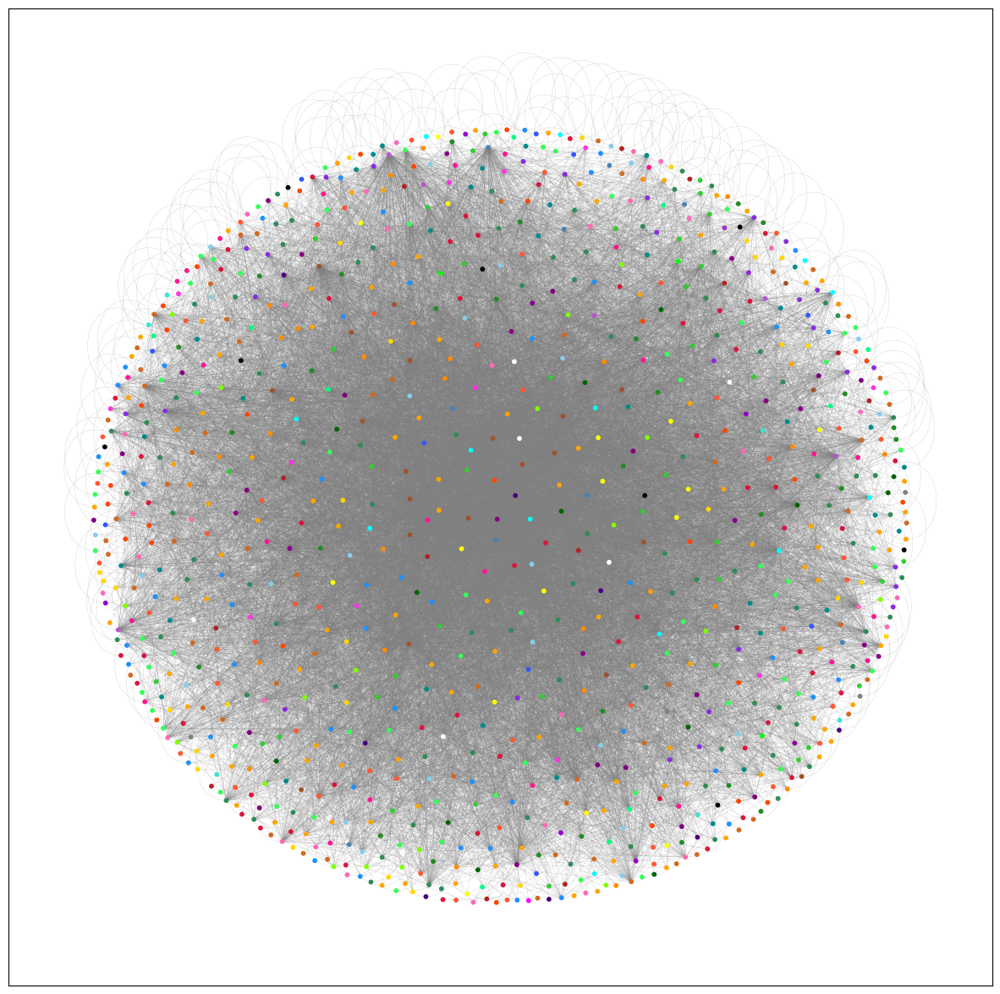

In [ ]:
plot_graph_networkx(G, pos = al)

In [ ]:
plot_graph_plotly(G,al)

In [ ]:
sl = nx.shell_layout(G)

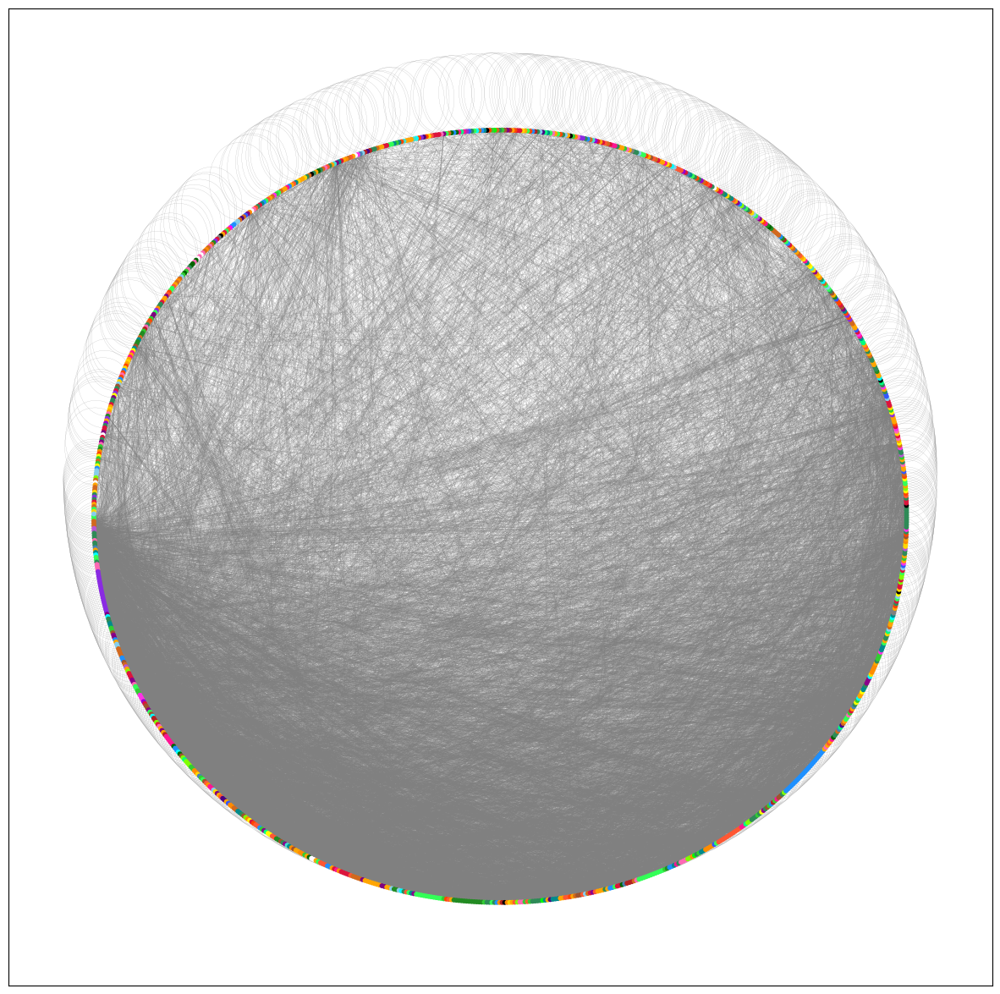

In [ ]:
plot_graph_networkx(G, pos = sl)

In [ ]:
plot_graph_plotly(G,sl )

In [ ]:
frl = nx.fruchterman_reingold_layout(G)

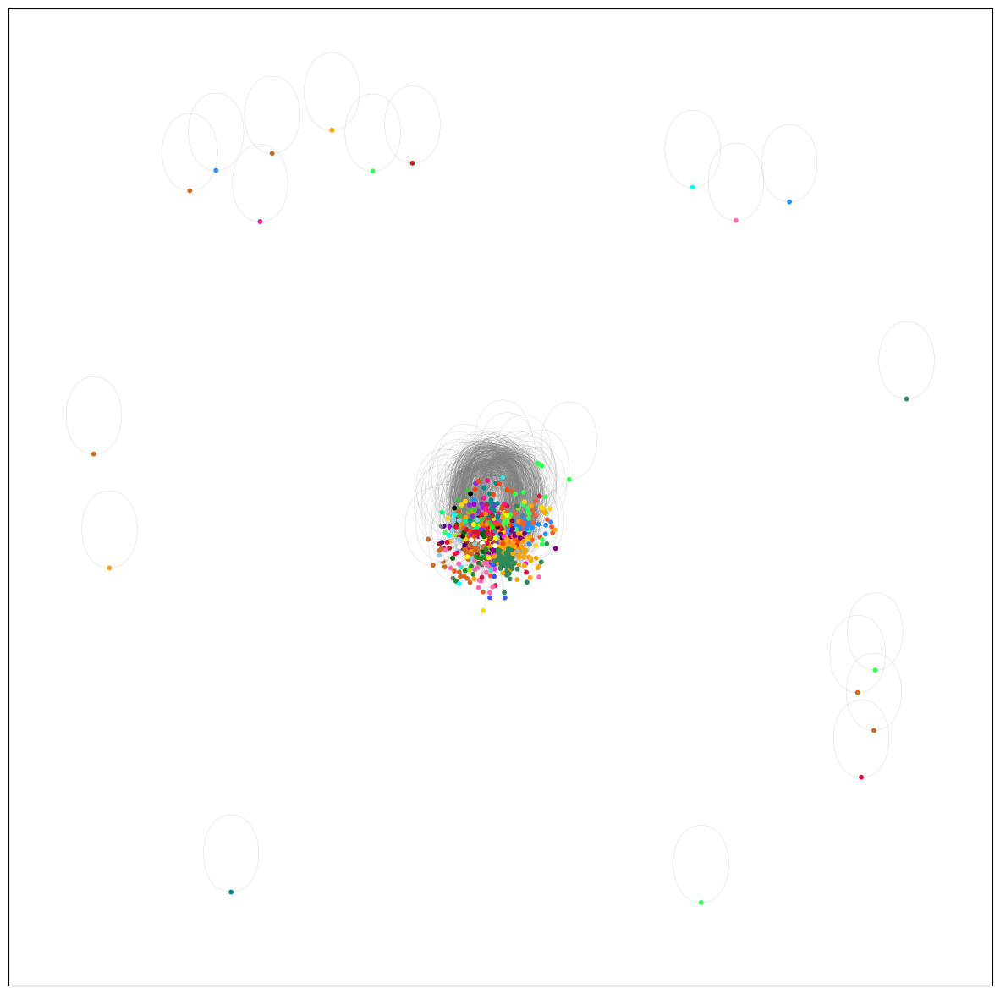

In [ ]:
plot_graph_networkx(G, pos = frl)

In [ ]:
plot_graph_plotly(G,frl )

In [ ]:
def print_centralities(G):
    #https://networkx.org/documentation/stable/reference/algorithms/centrality.html
    #degree centrality
    deg = nx.degree_centrality(G)
    clo = nx.closeness_centrality(G)
    eig = nx.eigenvector_centrality(G)
    betweenness = nx.betweenness_centrality(G)
    print("Degree centrality :- ")
    print(deg, "\n")
    print("Closeness centrality :- ")
    print(clo, "\n")
    print("Betweenness centrality")
    print(betweenness, "\n")
    print("Eigenvector centrality")
    print(eig, "\n")
    return deg, clo, eig, betweenness


In [ ]:
deg, clo, eig, betweenness = print_centralities(G)

Degree centrality :- 
{'0': 0.043824701195219126, '1': 0.05179282868525896, '2': 0.0946215139442231, '3': 0.07071713147410358, '4': 0.09561752988047809, '5': 0.17031872509960158, '6': 0.1145418326693227, '7': 0.07171314741035856, '8': 0.036852589641434265, '9': 0.0398406374501992, '10': 0.046812749003984064, '11': 0.07569721115537849, '12': 0.05776892430278884, '13': 0.17928286852589642, '14': 0.0796812749003984, '15': 0.05179282868525896, '16': 0.07370517928286853, '17': 0.11055776892430279, '18': 0.055776892430278883, '19': 0.07171314741035856, '20': 0.07370517928286853, '21': 0.13745019920318724, '22': 0.014940239043824702, '23': 0.08067729083665338, '24': 0.0398406374501992, '25': 0.03286852589641434, '26': 0.0348605577689243, '27': 0.06274900398406374, '28': 0.10458167330677291, '29': 0.05776892430278884, '30': 0.06772908366533864, '31': 0.049800796812749, '32': 0.0348605577689243, '33': 0.029880478087649404, '34': 0.030876494023904383, '35': 0.05876494023904382, '36': 0.044820717

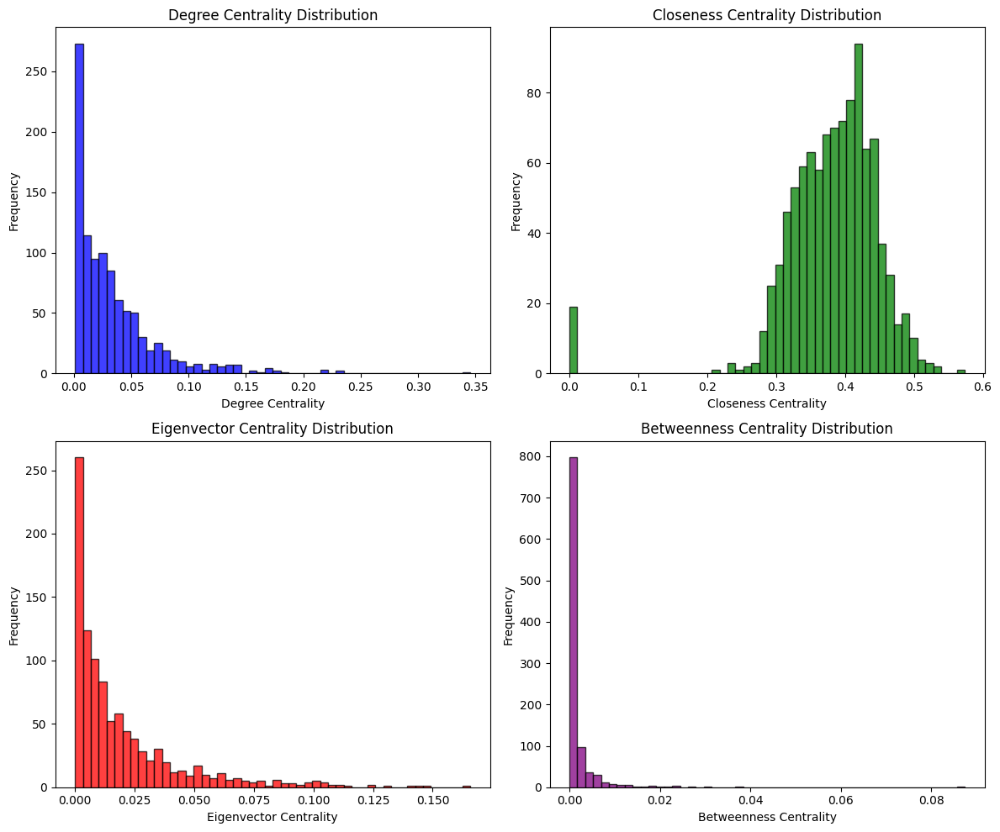

In [ ]:
# Create a figure with four subplots
fig, axs = plt.subplots(2, 2, figsize=(12, 10))

# Plot degree centrality histogram
axs[0, 0].hist(list(deg.values()), bins=50, alpha=0.75, color='blue', edgecolor='black')
axs[0, 0].set_xlabel('Degree Centrality')
axs[0, 0].set_ylabel('Frequency')
axs[0, 0].set_title('Degree Centrality Distribution')

# Plot closeness centrality histogram
axs[0, 1].hist(list(clo.values()), bins=50, alpha=0.75, color='green', edgecolor='black')
axs[0, 1].set_xlabel('Closeness Centrality')
axs[0, 1].set_ylabel('Frequency')
axs[0, 1].set_title('Closeness Centrality Distribution')

# Plot eigenvector centrality histogram
axs[1, 0].hist(list(eig.values()), bins=50, alpha=0.75, color='red', edgecolor='black')
axs[1, 0].set_xlabel('Eigenvector Centrality')
axs[1, 0].set_ylabel('Frequency')
axs[1, 0].set_title('Eigenvector Centrality Distribution')

# Plot betweenness centrality histogram
axs[1, 1].hist(list(betweenness.values()), bins=50, alpha=0.75, color='purple', edgecolor='black')
axs[1, 1].set_xlabel('Betweenness Centrality')
axs[1, 1].set_ylabel('Frequency')
axs[1, 1].set_title('Betweenness Centrality Distribution')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
# Characteristics of the network
print(f"Nodes : {G.number_of_nodes()}")
print(f"Edges : {G.number_of_edges()}")

# Find connected components
connected_components = list(nx.connected_components(G))

print(f"Number of connected components : {len(connected_components)}")

# diameter of each connected component
for i, component in enumerate(connected_components):
    subgraph = G.subgraph(component)

    # Check if the component is connected
    if nx.is_connected(subgraph):
        diameter = nx.diameter(subgraph)
        print(f"Diameter of component {i + 1}: {diameter}")
    else:
        print(f"Component {i + 1} is not connected.")

print("Isolated nodes:", [node for node in G.nodes() if G.degree[node] == 0])
print("Graph Density:", nx.density(G))

degree_sequence = sorted([d for n, d in G.degree()], reverse=True)
max_degree = max(degree_sequence)
min_degree = min(degree_sequence)
average_degree = sum(degree_sequence) / len(degree_sequence)
print(f"Max Degree: {max_degree}")
print(f"Min Degree: {min_degree}")
print(f"Average Degree: {average_degree:.2f}")

# Connected Components
components = list(nx.connected_components(G))
largest_component = max(components, key=len)
num_connected_components = len(components)
print(f"Size of Largest Component: {len(largest_component)}")
print(f"Number of Connected Components: {num_connected_components}")

# degree assortativity coefficient
degree_assortativity = nx.degree_assortativity_coefficient(G)
print(f"Degree Assortativity Coefficient: {degree_assortativity:.4f}")

Nodes : 1005
Edges : 16706
Number of connected components : 20
Diameter of component 1: 7
Diameter of component 2: 0
Diameter of component 3: 0
Diameter of component 4: 0
Diameter of component 5: 0
Diameter of component 6: 0
Diameter of component 7: 0
Diameter of component 8: 0
Diameter of component 9: 0
Diameter of component 10: 0
Diameter of component 11: 0
Diameter of component 12: 0
Diameter of component 13: 0
Diameter of component 14: 0
Diameter of component 15: 0
Diameter of component 16: 0
Diameter of component 17: 0
Diameter of component 18: 0
Diameter of component 19: 0
Diameter of component 20: 0
Isolated nodes: []
Graph Density: 0.03311331787278746
Max Degree: 347
Min Degree: 1
Average Degree: 33.25
Size of Largest Component: 986
Number of Connected Components: 20
Degree Assortativity Coefficient: -0.0110


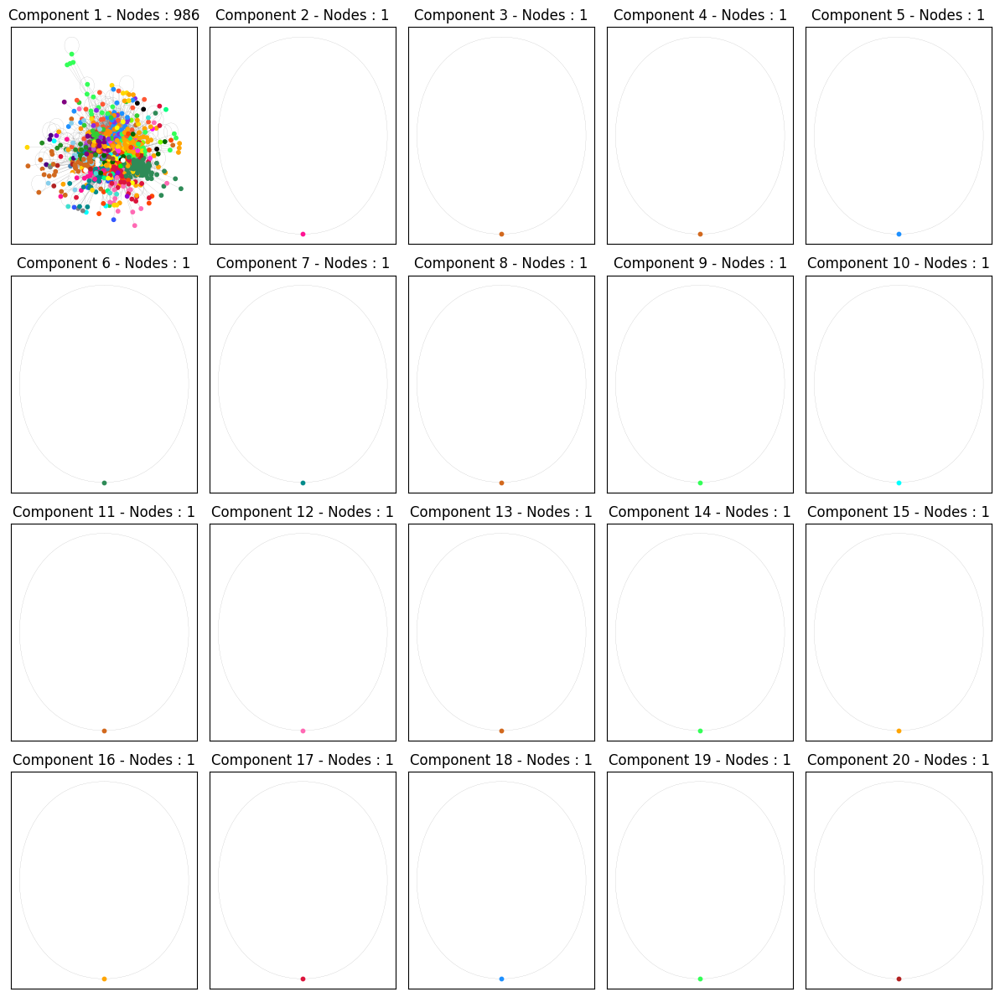

In [ ]:
# Find connected components
connected_components = list(nx.connected_components(G))

# Calculate the number of rows and columns for the subplot grid
num_components = len(connected_components)
num_rows = int(num_components ** 0.5)
num_cols = (num_components + num_rows - 1) // num_rows

# Create a grid of subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(12, 12))

# Iterate through connected components and draw them in subplots
for i, component in enumerate(connected_components):
    subgraph = G.subgraph(component)
    row = i // num_cols
    col = i % num_cols
    pos = nx.spring_layout(subgraph, seed=42)

    # Draw the subgraph in the corresponding subplot
    axs[row, col].set_title(f"Component {i + 1} - Nodes : {subgraph.number_of_nodes()}")
    # nx.draw(subgraph, pos, with_labels=True, node_color='skyblue', node_size=300, font_size=10, ax=axs[row, col])

    node_colors = [subgraph.nodes[node]['color'] for node in subgraph.nodes()]

    # Draw nodes with desired node color
    nx.draw_networkx_nodes(subgraph, pos, node_color=node_colors, node_size=10, ax=axs[row, col])

    # Draw edges with a specific edge width and color
    nx.draw_networkx_edges(subgraph, pos, width=0.1, edge_color='grey', ax=axs[row, col])

# Remove empty subplots if the number of components is not a perfect square
for i in range(num_components, num_rows * num_cols):
    fig.delaxes(axs[i // num_cols, i % num_cols])

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()